# ArcGIS GeoAnalytics for Microsoft Fabric: Spatial trends, aggregation, and hot spot analysis
In this notebook, we will explore methods for working with point datasets to understand spatial trends using data aggregation and hot spot analysis.  

Upon completion of this guide, you will have a good understanding of a variety of tools in [ArcGIS GeoAnalytics](https://developers.arcgis.com/geoanalytics-fabric/) for making sense of spatial distributions.  Let's begin! 


***Public Preview notes*** 
* ArcGIS GeoAnalytics is enabled in the Fabric Runtime 1.3 only

* In the ArcGIS GeoAnalytics _Public Preview_, to render base map tiles when plotting maps using the [`st.plot`](https://developers.arcgis.com/geoanalytics-fabric/api-reference/geoanalytics_fabric.extensions.html#plot) functionality, you will need to run the following configuration cell when starting your computing environment.  Note that using the configuration will lead to a slower startup for the computing environment.  This is not necessary if you do not require the base map tiles in your map.  Spatial data in your DataFrame will still render, however you will not have the base map tiles in the background. 

In [1]:
%%configure -f
{    
    "conf":    
    {   
        "spark.driver.extraJavaOptions" : "--add-opens java.base/jdk.internal.loader=ALL-UNNAMED",
        "spark.jars.packages": "com.google.protobuf:protobuf-java:3.25.5"    
    }
}

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, -1, Finished, Available, Finished)

## Add a Lakehouse
***There is only one segment of this tutorial that writes data to the Lakehouse.  If you do not want to create a Lakehouse for this tutorial, you do not need to.  You can skip this section and skip the cell later in the tutorial that demonstrates writing results to the Lakehouse***

The Fabric Lakehouse is a location where you can store and manage your data.  To work with data within your Fabric environment, you will need to connect to a Lakehouse that houses the data.  

Your Lakehouse must be connected before you start your computing session.

To connect to a Lakehouse, click on ```Lakehouses``` in the Explorer pane and ```Add Lakehouse```

You can add an existing Lakehouse, or create a new one for this tutorial.  

For more information, refer to ["What is a lakehouse in Microsoft Fabric?"](https://learn.microsoft.com/en-us/fabric/data-engineering/lakehouse-overview)

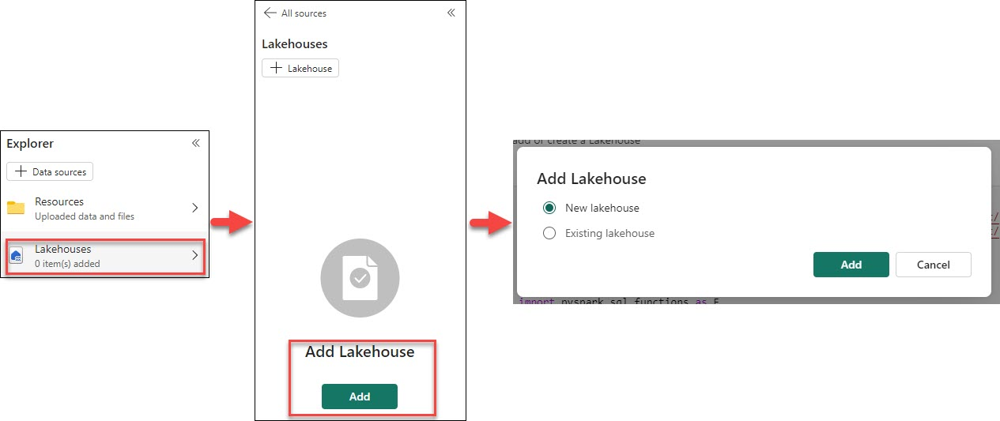

## Import ArcGIS GeoAnalytics
Import the ArcGIS GeoAnalytics for Microsoft Fabric library.

The library is named ```geoanalytics_fabric```

This imports the library at the top level.  To make the functionality easier to access, we recommend also importing the [geospatial functions](https://developers.arcgis.com/geoanalytics-fabric/sql-functions/) directly, and to give them an easy to use alias for reference.  In the example below, we import the library and the functions with an alias of ```ST```.  Since each of the functions are named ST.\<function_name\> this makes them easy to reference and identifies them as being Spatial Type (ST) functions. This will also align with the structure of examples throughout the ArcGIS GeoAnalytics documentation.

For instance, after importing, you would be able to reference the [ST_Buffer](https://developers.arcgis.com/geoanalytics-fabric/sql-functions/st_buffer/) function using ```ST.buffer``` instead of ```geoanalytics_fabric.sql.functions.buffer```

In [3]:
# import ArcGIS GeoAnalytics
import geoanalytics_fabric
import geoanalytics_fabric.sql.functions as ST
import pyspark.sql.functions as F

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 4, Finished, Available, Finished)

## Ingest data 

For this sample notebook, we will use a dataset of [public safety data from the city of Boston, MA](https://learn.microsoft.com/en-us/azure/open-datasets/dataset-boston-safety) from the [Azure open datasets](https://azure.microsoft.com/en-us/products/open-datasets).   

This dataset is in a parquet format and contains latitude and longitude coordinates for each record.

To read the data, we can use the code sample provided on the Azure open dataset page for working with PySpark in Azure Synapse.  

When the data are read in, we are adding one additional cleaning step to create a geometry column using the ArcGIS GeoAnalytics [ST_Point](https://developers.arcgis.com/geoanalytics-fabric/sql-functions/st_point/) function. This takes inputs for the latitude and longitude coordinates as well as the spatial reference (4326) and generates a point geometry.


In [4]:
# Azure storage access info
# https://learn.microsoft.com/en-us/azure/open-datasets/dataset-boston-safety?tabs=pyspark
blob_account_name = "azureopendatastorage"
blob_container_name = "citydatacontainer"
blob_relative_path = "Safety/Release/city=Boston"
blob_sas_token = r""

# Allow SPARK to read from Blob remotely
wasbs_path = 'wasbs://%s@%s.blob.core.windows.net/%s' % (blob_container_name, blob_account_name, blob_relative_path)
spark.conf.set(
  'fs.azure.sas.%s.%s.blob.core.windows.net' % (blob_container_name, blob_account_name),
  blob_sas_token)
print('Remote blob path: ' + wasbs_path)

# SPARK read parquet
# add a new point geometry column with ArcGIS GeoAnalytics ST_Point function 
df = spark.read.parquet(wasbs_path)\
  .withColumn("geometry", ST.point("longitude", "latitude", 4326))

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 5, Finished, Available, Finished)

Remote blob path: wasbs://citydatacontainer@azureopendatastorage.blob.core.windows.net/Safety/Release/city=Boston


After reading the data, we can display the table and count the records to get a sense of the data that we will be working with.  The dataset is public safety requests (311 service calls / requests). Each record has a date and time for when the request was submitted, several fields to describe the request type, point-level location information, status (open or closed), and source.

In [5]:
# display the data to see what we are working with
display(df)

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 6, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 5c3d37e3-61ac-4815-abd5-7075872391fd)

In [6]:
# how many records?
df.count()

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 7, Finished, Available, Finished)

2455598

### Clean up invalid latitude and longitude values

An important first step in working with spatial data is to look for incorrect or erroneous geometries. 

One way to do this is visually on a map, which you can see in the cell below, but you can also check for some common issues using Fabric's [Data Wrangler](https://learn.microsoft.com/en-us/fabric/data-science/data-wrangler).

The dataset in this notebook happens to have some incorrect / out-of-expected range values for the service call location coordinates.  We'll go ahead and clean those out before we start working with the data further.



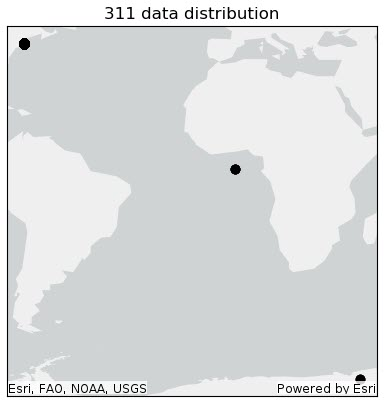

The points off the coast of Africa are data points erroneously listed with latitude and longitude values of 0. They are often described as being on [Null Island](https://en.wikipedia.org/wiki/Null_Island), a common "location" for data with missing values. 

The points in Antarctica most likely had their latitude and longitude values flipped.

If we use PySpark [describe()](https://spark.apache.org/docs/latest/api/python/reference/pyspark.sql/api/pyspark.sql.DataFrame.describe.html) to look at the range of values for latitude and longitude, we can see that there are values outside the range of what would be expected for Boston (latitude of ~42.33, and longitude of ~-71.07)

In [7]:
# Use PySpark describe() to look at the range of values for latitude and longitude
# The city of Boston is centered at a latitude of: ~42.33, and a longitude of: ~-71.07
# The values shown below suggest that we have some latitude and longitude values that are erroneous 
# These might be that the entries were swapped or due to typos
df.select("latitude", "longitude").describe().show()

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 8, Finished, Available, Finished)

+-------+-------------------+------------------+
|summary|           latitude|         longitude|
+-------+-------------------+------------------+
|  count|            2416538|           2416538|
|   mean|  42.32541813203023|-71.08340896253915|
| stddev|0.24557136772116778|0.2668960195100962|
|    min| -71.13580999993192| -71.1906604328631|
|    max| 42.398986182218465|42.393246999947344|
+-------+-------------------+------------------+



Besides visually exploring on a map, we can explore the distribution of values using [Fabric's Data Wrangler](https://learn.microsoft.com/en-us/fabric/data-science/data-wrangler) to check for anomalies and to automatically generate the code to clean out the erroneous values.  This provides another option to find the exact values in the dataset that are out of the expected range. However, by default, Data Wrangler works with a sample of the dataset, so if you have a large dataset the sample may not include the erroneous values if there are only a small number of them distributed through the dataset. 

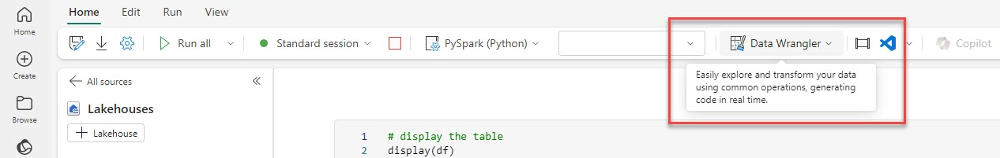

As noted above, by default, Data Wrangler uses a sample of the data for exploring the distributions.  In this case, the default sample doesn't highlight the problems that we can see in the map above, or using `describe()` as these use the entire dataset for the calculations.  This is shown in the Data Wrangler charts below.  It is likely that there aren't a large number of erroneous values in the dataset, but they are still there and should be weeded out before we continue with analyses.

Point locations far outside of the expected range can slow down analyses or throw off the results of our spatial statistical tests, so it is best to clean them out to start.

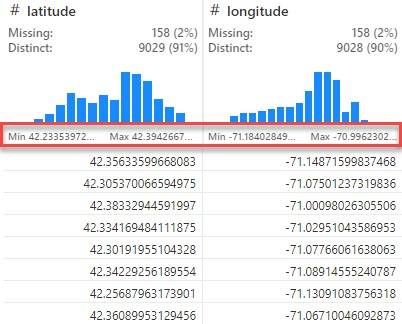

While the summaries in Data Wrangler may not show the invalid latitude and longitude values with the default sample size, we can still use Data Wrangler to more easily write a code block to clean the data.  In this case, we'll use the tool to quickly filter out values with latitude values that are too far south to be in the Boston area, or to far east.

Data Wrangler can then convert this into valid PySpark code to use in our notebook.


In [8]:
# Code generated by Data Wrangler for PySpark DataFrame

def clean_data(df):
    # Filter rows based on columns: 'latitude', 'longitude'
    df = df.filter((df['latitude'] > 40 ) & (df['longitude'] < -70))
    return df

df_clean = clean_data(df)
display(df_clean)

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 9, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 55855501-3d5a-4bf4-814c-ca5321126ba6)

To get a sense of how many records were filtered out, we can look at the count of records and compare the count of records after we initially read the data from the Azure Open Datasets.



In [9]:
# count the number of records
df_clean.count()

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 10, Finished, Available, Finished)

2416520

In [10]:
# difference - or how many points were removed in the cleaning step
df.count() - df_clean.count()

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 11, Finished, Available, Finished)

39078

We can also plot the cleaned dataset to confirm that the data all aligns as expected in the correct geographic area.

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 12, Finished, Available, Finished)

<Axes: >

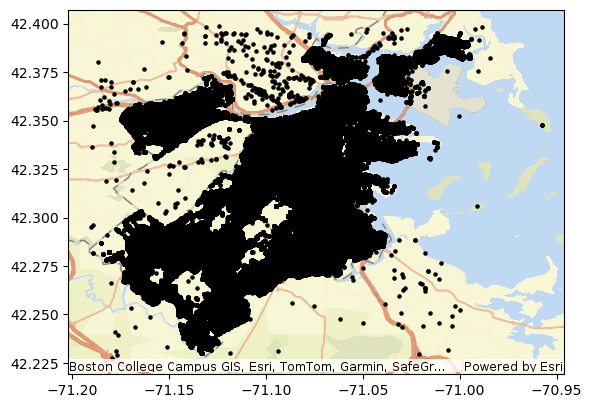

In [11]:
df_clean.st.plot(basemap="streets", color="black", marker_size=5)

## Enrich points with attributes from relevant geographies

Sometimes the dataset that you are working with doesn't have all of the attributes that you want or need for your analyses.  

Data can be easily augmented with relevant characteristics using relationships between attributes or geography when working with ArcGIS GeoAnalytics.  To enrich the data based on location, we can use a spatial join.  More information about spatial joins can be found in the ArcGIS GeoAnalytics [core concept on spatial joins](https://developers.arcgis.com/geoanalytics-fabric/core-concepts/spatial-joins/).

ArcGIS GeoAnalytics includes several functions for assessing spatial relationships. In this case, we will use [ST_Within](https://developers.arcgis.com/geoanalytics-fabric/sql-functions/st_within/) to find the polygon that each point falls _within_.   

To demonstrate, we will use a set of data with US Census 2020 demographics hosted from the [ArcGIS Living Atlas of the World](https://livingatlas.arcgis.com/en/home/).  The Living Atlas is the foremost collection of geographic information from around the globe.



First, we will read in a geospatial dataset containing [USA 2020 Census Housing Characteristics](https://www.arcgis.com/home/item.html?id=81d9e89b8b574a649ff6e14f61c8494f).  This dataset includes housing units by tenure (owner or renter), and vacancy status data from the 2020 Census Demographic and Housing Characteristics, as well as additional calculated attributes. We will obtain the data at the blockgroup geography level.

ArcGIS GeoAnalytics has built in functionality for reading data from Esri feature services, as we will see in the cell below.

When we read in the data, we will filter to just Suffolk County, Massachusetts (where Boston is located) to simplify future calculations since we don't need to use the data for the entire United States, just the area that overlaps our area of interest.

In [12]:
# URL for the Living Atlas feature service Census housing characteristics / demographics at blockgroup level
fs_bg = "https://services.arcgis.com/P3ePLMYs2RVChkJx/arcgis/rest/services/USA_Census_2020_DHC_Housing_Units/FeatureServer/4"

# read in the data and filter to just Suffolk County, Massachusetts
df_bg_demos = spark.read.format("feature-service").load(fs_bg)\
    .filter(F.col("State") == "Massachusetts" )\
    .filter(F.col("County") == "Suffolk County")

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 13, Finished, Available, Finished)

There are a lot of attributes included in this feature service.  

The list of attributes and their aliases / descriptions can be found from the [descriptive entry in the Living Atlas](https://www.arcgis.com/home/item.html?id=81d9e89b8b574a649ff6e14f61c8494f#overview).  For instance, if we look on the Data tab for this dataset, under Fields we can see the full set of field names and details.  

The image below highlights the `GEOID` field as the Geographic Identifier.  The Geographic Identifier is also known as the FIPS code, or GEOID.  This is a numeric code used to uniquely identify all administrative/legal and statistical geographic areas for which the Census Bureau tabulates data.  

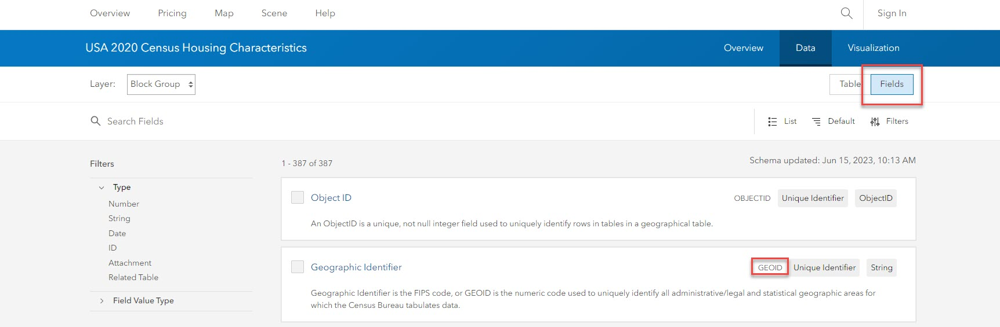

We can also display the table to get a better sense of the range of data provided from the feature service

In [13]:
# display the demographic data from the Living Atlas
display(df_bg_demos)

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 14, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, cba1e128-d918-454f-98e6-ff0cd4865a48)

We can also plot the data to see its distribution and extent. In the cell below, we will look at one specific attribute:
* `H0004F_calc_pctOwn` - Homeownership Rate - Percent of occupied housing units that are owner-occupied. A housing unit is owner-occupied if the owner or co-owner lives in the unit, even if it is mortgaged or not fully paid for.

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 15, Finished, Available, Finished)

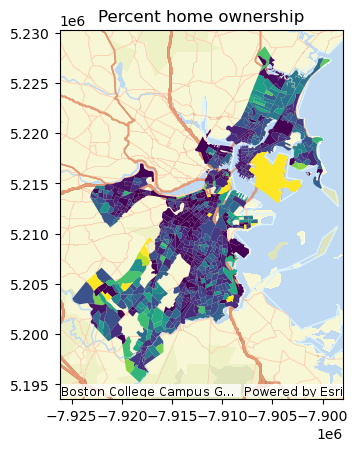

In [14]:
myplot = df_bg_demos.st.plot(basemap="streets", 
    cmap_values="H004F_calc_pctOwn",
    )

myplot.set_title("Percent home ownership");

Now we will join our service call dataset to these blockgroups so that every point is enriched with attributes related to the Census Housing Characteristics.  This would allow us to explore questions such as whether there are more requests in areas with greater or lower homeownership.

In the join in the cell below, we use [ST_Within](https://developers.arcgis.com/geoanalytics-fabric/sql-functions/st_within/) to identify the polygon that each point falls inside.

In [15]:
# Join service calls and block groups based on which point is _within_ which blockgroup polygon
df_clean = df_clean.join(df_bg_demos, ST.within("geometry", "shape"))

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 16, Finished, Available, Finished)

After the join, we can look at the data to see all of the new attributes attached to our service calls.

In [16]:
# display the results of the spatial join - each service call should have attributes from the block group it is inside
display(df_clean)

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 17, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 4c4c5b34-09eb-469c-9969-67ad3cffdd0f)

Once these new attributes have been joined to our dataset based on their location, we can use the attributes in analyses.  For instance, you could explore if there were  differences in number of service requests in areas with higher or lower homeownership rates.  Or you could determine if the rate of requests that were open vs. closed was higher in areas with higher or lower homeownership rates.  
 
As a simple example, we can bin the homeownership percentage data that we joined in from the Census data in the Living Atlas to create a classification of "high" versus "low" homeownership.

In [17]:
from pyspark.sql.functions import when

df_clean = df_clean\
    .withColumn("Pct_Homeowner_Bins", 
        when(F.col("H004F_calc_pctOwn") < 50, "Low").otherwise("High"))

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 18, Finished, Available, Finished)

Using those bins, we can then group our data and look at the counts of requests for each category.

In [18]:
display(df_clean.groupby("Status", "Pct_Homeowner_Bins",).count())

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 19, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, ec010378-1fdb-4c1c-8b98-5bf36b6d12d5)

### Cleaned and enriched data can be written back out to OneLake
***This step is optional; not required to complete running the notebook***

Spatially enriching the attributes in your dataset can help fuel your ML models or other analyses. The results of the enrichment process can easily be written out to [OneLake](https://learn.microsoft.com/en-us/fabric/onelake/onelake-overview) to share with users across your Fabric workspace.

In the example below, we write a subset of attributes as a Delta table.

If you want to explore writing the data results, you can un-comment the cell below and run it.  To write the data, you will need to have a lakehouse attached to the notebook.

In [19]:
## Write a subset of the joined attributes to the attached Lakehouse 

# df_clean.select("dataType", "dataSubtype", "dateTime", "category", "subcategory", "status", "address", "latitude", "longitude", 
#     "source", "extendedProperties", "OBJECTID", "GEOID", "Name", "State", "County", "P0010001", "H0010001").write\
#     .mode("overwrite")\
#     .format("delta")\
#     .save("Tables/service_calls_cleaned_enriched")

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 20, Finished, Available, Finished)

## Spatial binning to uncover patterns & simplify for visualization

It is common with point datasets to have enough data that the points on the map overlap and hide patterns in the distribution.  This happens because the points overlap enough that you cannot visually identify the density - if the whole map is fully covered with data markers, there is no pattern other than a fully covered map.

Spatial aggregation can be useful in these cases to make it easier to identify general spatial patterns in point datasets. Spatial aggregation allows you to count up the number of points that fall into discrete geographic regions (e.g., squares,  hexagons, school districts, census tracts, etc.) and then map the counts of points, or other aggregates of the attributes, into each of these polygons.

In addition to identifying spatial patterns by aggregating the data, this also helps for creating datasets for BI tools, like [Power BI](https://www.microsoft.com/en-us/power-platform/products/power-bi) to more easily visualize the data in dashboards.

Let's take a look at the data that we have and explore how spatial binning and aggregation can help.


First, we can plot the data to see the overall distribution.  Here we can see that there is little pattern to identify due to the density of the data, even when using a relatively small marker size.


StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 21, Finished, Available, Finished)

<Axes: >

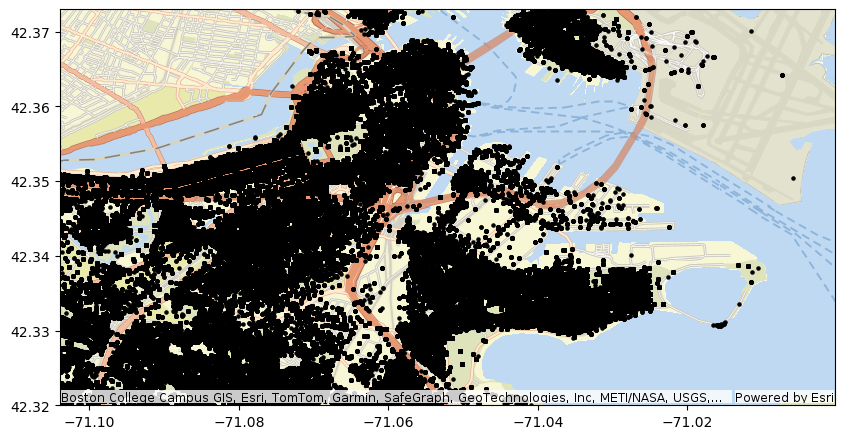

In [20]:
# there is a lot of data here!
# in this example we are just looking at a small extent of the overall area covered by our dataset
df_clean.st.plot(basemap="streets", color="black", figsize=(10,10), geometry="geometry", marker_size=5, extent=(-71.104, 42.320, -71.0003, 42.373))

To help make sense of the distribution, we will aggregate using the [Aggregate Points](https://developers.arcgis.com/geoanalytics-fabric/tools/aggregate-points/) tool in ArcGIS GeoAnalytics. Aggregate Points summarizes points into polygons or bins (square, hexagonal, or H3). The boundaries from the polygons or bins are used to collect the points within each area and use them to calculate statistics. The result always contains the count of points within each area.  

Note that analysis with hexagonal or square bins requires that your input geometry has a projected coordinate system. If your data is not in a projected coordinate system, the tool will transform your input to a World Cylindrical Equal Area (SRID: 54034) projection. You can transform your data to a projected coordinate system by using [ST_Transform](https://developers.arcgis.com/geoanalytics-fabric/sql-functions/st_transform/). Analysis with H3 bins requires that your input DataFrame's geometry is in the World Geodetic System 1984 coordinate system. If not, this transformation will be applied.

More information about projections and coordinate systems can be found in the core concept on [Coordinate systems and transformations](https://developers.arcgis.com/geoanalytics-fabric/core-concepts/coordinate-systems/).

You can check the coordinate system of your data with the [get_spatial_reference](https://developers.arcgis.com/geoanalytics-fabric/api-reference/geoanalytics_fabric.extensions.html#get-spatial-reference) functionality.  In the cell below, we check the spatial reference for the point geometry in our DataFrame.


In [21]:
# check the spatial reference
df_clean.st.get_spatial_reference("geometry")

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 22, Finished, Available, Finished)

SpatialReference(srid=4326, is_projected=False, unit='Degree', wkt='GEOGCS["GCS_WGS_1984",DATUM["D_WGS_1984",SPHEROID["WGS_1984",6378137.0,298.257223563]],PRIMEM["Greenwich",0.0],UNIT["Degree",0.0174532925199433]]')

The cell below uses the [Aggregate Points](https://developers.arcgis.com/geoanalytics-fabric/tools/aggregate-points/) tool to divide our data up into square spatial bins with an 0.1 mile long side.  

When we bin the data in the cell below, we will create two versions.  You can create bins based on specific time frames, for instance, a set of bins for every year, month, or day in the dataset.  Binning with a time step requires that time is enabled on the input DataFrame (e.g., you have a timestamp column).  

By default, time slicing is automatically aligned at January 1, 1970, and steps are calculated from that point.  This can be adjusted if you want to specify a time for the time steps to begin (instead of the default January 1, 1970).  This is done using a _reference time_. A reference time can be a date (January 1, 2016) or a time and date (January 1, 2016, at 9:30 a.m.). 

More details on time stepping can be found in the core concept documentation for [time stepping](https://developers.arcgis.com/geoanalytics-fabric/core-concepts/time-stepping/).


In [22]:
# bin the data
from geoanalytics_fabric.tools import AggregatePoints

# Since our input DataFrame has more than one geometry (from our earlier spatial join), we can explicitly set the geometry field to our point geometry
df_clean = df_clean.st.set_geometry_field("geometry")

# if there is a single timestamp field it is generally automatically recognized. If not, or if you have more than one timestamp, you can explicitly set it
df_clean = df_clean.st.set_time_fields("dateTime")

# aggregate points into square bins
result_agg = AggregatePoints() \
            .setBins(bin_size=0.1, bin_size_unit="Miles", bin_type="Square") \
            .run(df_clean)

# aggregate points into square bins - for every 1 year in the data.  By default the yearly interval starts at January 1
# this can be adjusted with the reference_time parameter input
result_agg_yearly = AggregatePoints() \
            .setBins(bin_size=0.1, bin_size_unit="Miles", bin_type="Square") \
            .setTimeStep(interval_duration=1, interval_unit="years") \
            .run(df_clean)

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 23, Finished, Available, Finished)

The result of [Aggregate Points](https://developers.arcgis.com/geoanalytics-fabric/tools/aggregate-points/) gives us a new dataframe with a simplified set of aggregated data.  If we plot the results, we can more easily see the patterns of distribution in our data, with higher volumes of service requests in the northern parts of the city.

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 24, Finished, Available, Finished)

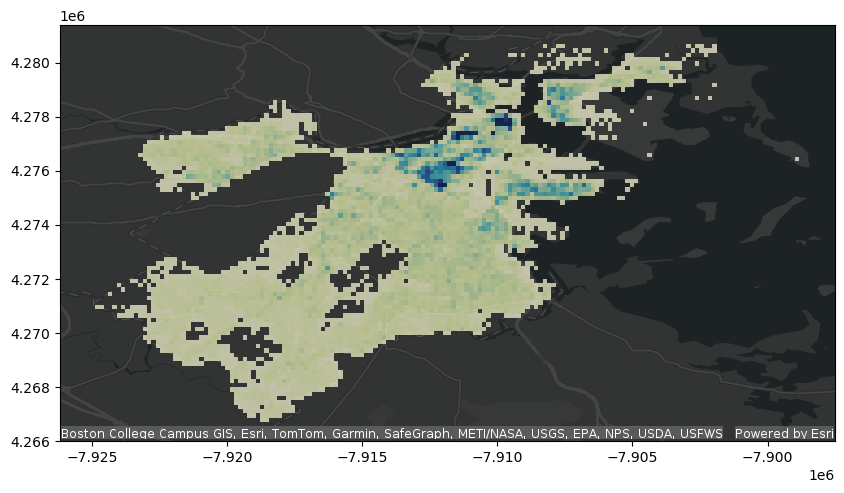

In [23]:
# plot results from aggregating points into square bins; this plot shows the count of service requests in each bin
result_agg.st.plot(cmap_values="COUNT",
                             basemap="dark",
                             cmap="YlGnBu",                             
                             alpha=0.7,
                             vmax=5000,
                             figsize=(10,10));

By setting the extent in our plot, we can zoom in to see more detail in the area of interest.

The extent is defined by the coordinates of the area of interest as _(min_x, min_y, max_x, max_y)_

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 25, Finished, Available, Finished)

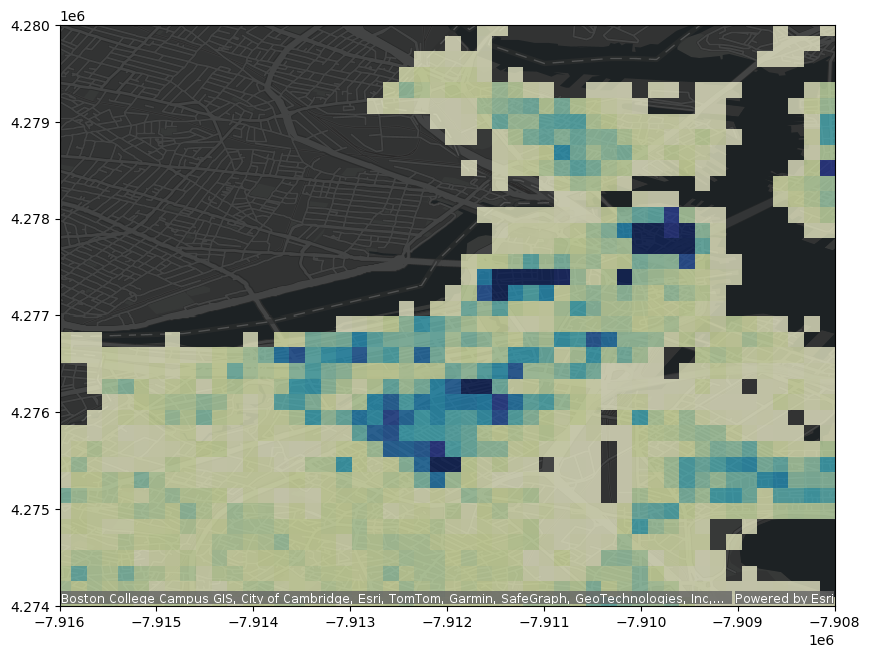

In [24]:
# plot results from aggregating points into square bins; this plot shows the count of service requests in each bin
# the plot is zoomed into a smaller area of interest setting an _extent_
result_agg.st.plot(cmap_values="COUNT",
                             basemap="dark",
                             cmap="YlGnBu",
                             vmax=5000,
                             extent=(-7.916e6, 4.274e6, -7.908e6, 4.280e6),
                             alpha=0.7,
                             figsize=(10,10));

We can also examine the results by year using the yearly aggregated bin data.  For instance, if we wanted to compare trends in 2013 and 2023, we could plot them both to visually explore.




StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 26, Finished, Available, Finished)

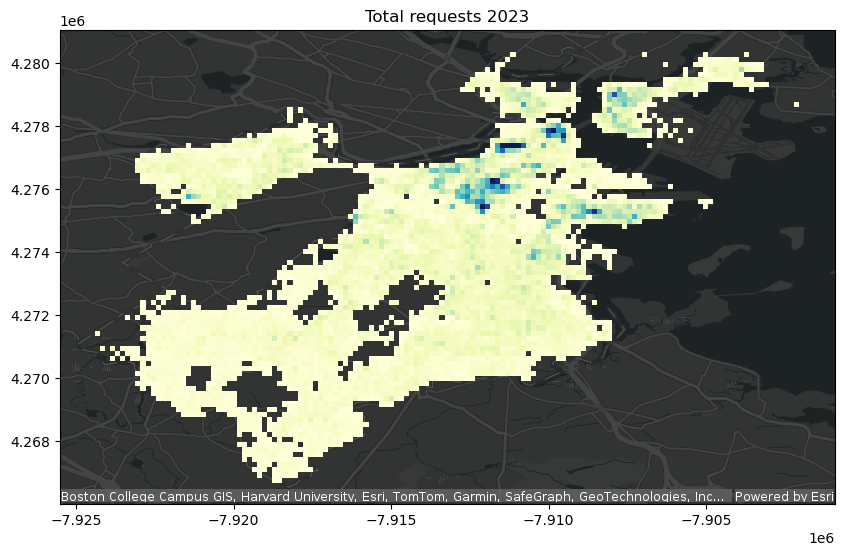

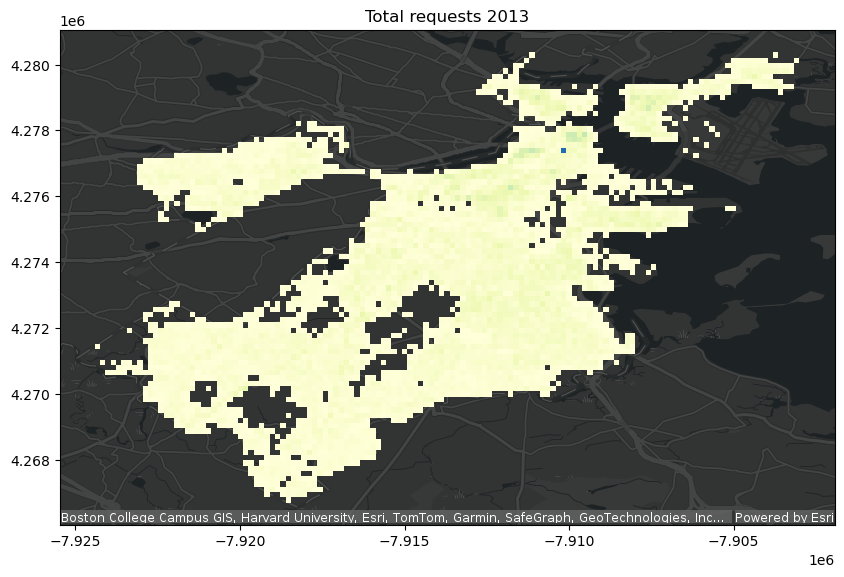

In [25]:
# plot results from aggregating points into square bins for _one_ year (2023)
result_plot = result_agg_yearly\
    .filter(F.year("step_start") == 2023)\
    .st.plot(cmap_values="COUNT",
                             basemap="dark",
                             cmap="YlGnBu",
                             vmax=1000,
                             figsize=(10,10))

result_plot.set_title("Total requests 2023");

# plot results from aggregating points into square bins for _one_ year (2013)
result_plot = result_agg_yearly\
    .filter(F.year("step_start") == 2013)\
    .st.plot(cmap_values="COUNT",
                             basemap="dark",
                             cmap="YlGnBu",
                             vmax=1000,
                             figsize=(10,10))

result_plot.set_title("Total requests 2013");  

***Explore by Census geography***

In addition to the Aggregate Points tool, we can use PySpark [GroupBy](https://spark.apache.org/docs/latest/api/python/reference/pyspark.sql/api/pyspark.sql.DataFrame.groupBy.html) to aggregate data when there is a common attribute.  When we joined the attributes from the Census blockgroups earlier, we added a geometry ("shape") and unique identifier for each geometry ("GEOID").  We can aggregate our point data using those columns as well.

The cell below groups the data based on `GEOID` (a unique geographic identifier), and then returns a count of features and the first `shape` for the group since the `shape` (geometry) is the same for all records with the same `GEOID`.

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 27, Finished, Available, Finished)

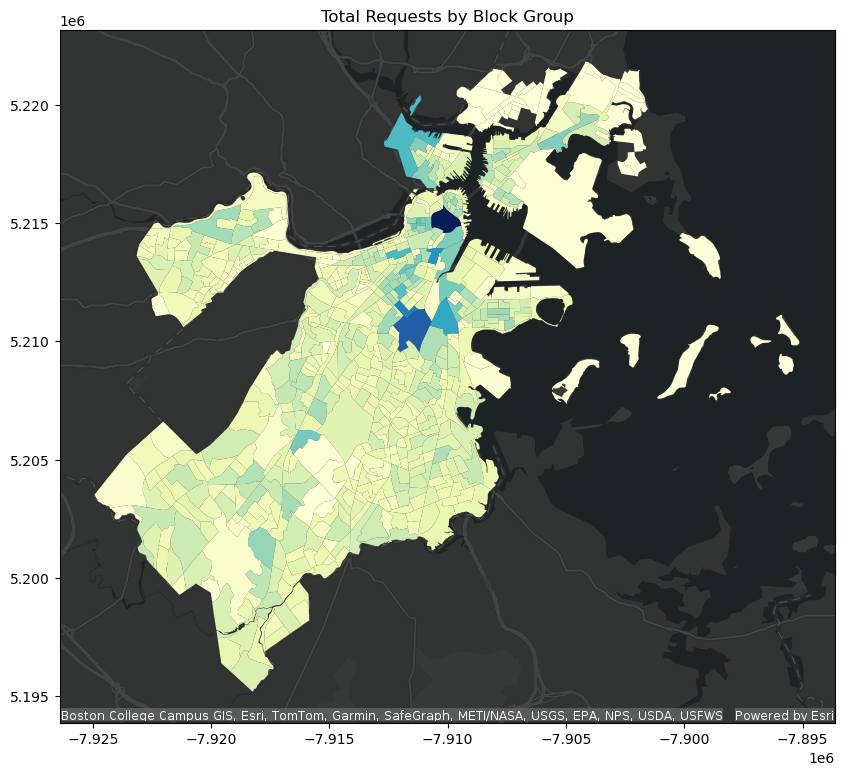

In [26]:
# plot results at the Census blockgroup level using the blockgroup geometry joined in from the Living Atlas
plt_block = df_clean\
    .groupby("GEOID").agg(F.count("GEOID").alias("count"), F.first("shape").alias("shape"))\
    .st.plot(cmap_values="count",
                             basemap="dark",
                             cmap="YlGnBu",
                             figsize=(10,10));

plt_block.set_title("Total Requests by Block Group");  

#### Write results to OneLake for use with Power BI or other tools

The results of the aggregation process can easily be written out to OneLake to share with users across your Fabric workspace, or to use in other workloads like Power BI.

In the example below, we write a subset of attributes as a Delta table.

If you want to write the data, you can un-comment the cell below and run it.  

***If you have not attached a lakehouse to this notebook you will not be able to write spatial data using the example below***

In [27]:
# # write to OneLake
# For this table, we are including COUNT, start/end times, year, and three representations of the geometry (as EsriJSON, and as x,y coordinates for the polygon centroid)
# result_agg_yearly.select("COUNT", 
#                         "step_start", "step_end", F.year("step_start").alias("year"), 
#                         ST.as_esri_json(ST.transform("bin_geometry", 4326)).alias("shape_json"), 
#                         ST.x(ST.centroid(ST.transform("bin_geometry", 4326))).alias("bin_x"), 
#                         ST.y(ST.centroid(ST.transform("bin_geometry", 4326))).alias("bin_y"))\
#                 .write\
#                 .mode("overwrite")\
#                 .format("delta")\
#                 .save("Tables/service_calls_yearly_bins")

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 28, Finished, Available, Finished)

#### Explore increases or decreases over time

Using the yearly data, we can also explore patterns of change over time.  In the cell below we pivot our dataset so that each bin has columns for the yearly aggregates.  

In [28]:
# create a new column with just the _year_ value from the start date of each timestep
result_agg_yearly = result_agg_yearly.withColumn("year", F.year("step_start"))

# pivot the DataFrame so that each year of data is now in a separate _column_ for each bin location
result_pivot = result_agg_yearly.groupBy("bin_geometry")\
        .pivot("year") \
        .agg(F.sum("COUNT"))

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 29, Finished, Available, Finished)

In [29]:
# display the table of data with each spatial bin showing a column for each year of data
display(result_pivot)

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 30, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 7c1c9f75-dcfb-4411-933f-3ce5f274547a)

Once the data has been pivoted, we can calculate new fields using the combination of columns needed to obtain the desired result.

In the example below, we will generate a simple difference between 2022 and 2023.

In [30]:
# calculate a new column showing the difference in number of service requests between two years
# this difference is calculated for each spatial bin in the dataset
result_pivot = result_pivot\
    .withColumn("diff_2022_2023", F.col("2023") - F.col("2022"))

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 31, Finished, Available, Finished)

In the map below, we highlight the difference in a smaller area of interest. This area of interest is specified with the `extent` parameter.  The more orange areas show a decrease in service requests, and the more purple show an increase in service requests.

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 32, Finished, Available, Finished)

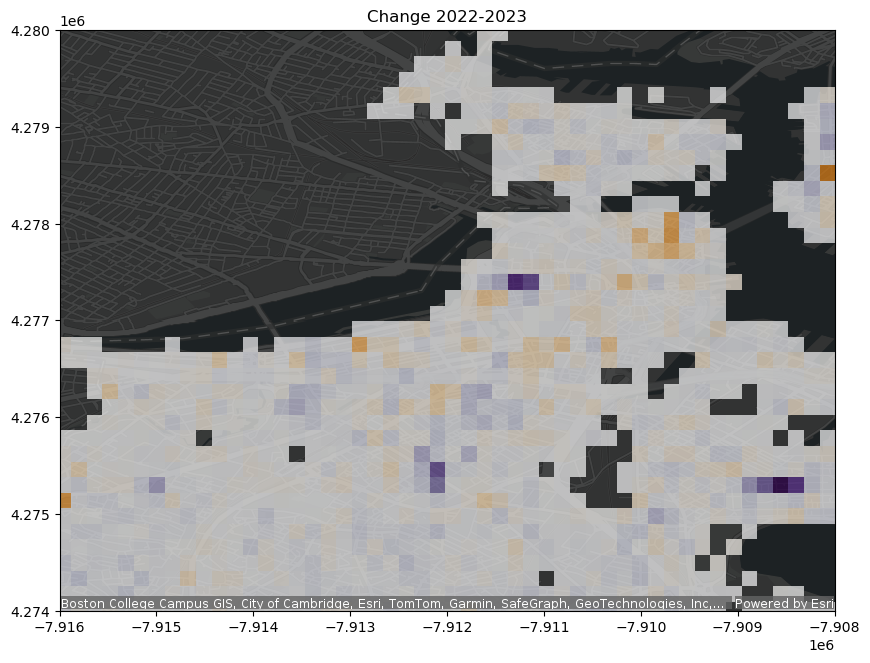

In [31]:
# using matplotlib's TwoSlopeNorm to center the color ramp at 0
from matplotlib.colors import TwoSlopeNorm

# plot results showing the difference (increase or decrease) in number of service requests
# this map will zoom to the specific geographic extent 
result_plot = result_pivot\
    .st.plot(cmap_values="diff_2022_2023",
                             basemap="dark",
                             cmap="PuOr",
                             norm=TwoSlopeNorm(vmin=-500,vcenter=0, vmax=500),
                             alpha=0.7,
                             extent=(-7.916e6, 4.274e6, -7.908e6, 4.280e6),
                             figsize=(10,10))
result_plot.set_title("Change 2022-2023");

## Find statistical hot spots

[Find Hot Spots](https://developers.arcgis.com/geoanalytics-fabric/tools/find-hot-spots/) identifies statistically significant spatial clusters of many records (hot spots) and few records (cold spots).

The [Find Hot Spots](https://developers.arcgis.com/geoanalytics-fabric/tools/find-hot-spots/) tool calculates the [Getis-Ord Gi*](https://en.wikipedia.org/wiki/Getis%E2%80%93Ord_statistics) statistic (pronounced G-i-star) for each feature in a dataset. The resultant z-scores and p-values tell you where features with either high or low values cluster spatially. This tool works by looking at each feature within the context of neighboring features. A feature with a high value is interesting but may not be a statistically significant hot spot. To be a statistically significant hot spot, a feature will have a high value and be surrounded by other features with high values as well.

[Find Hot Spots](https://developers.arcgis.com/geoanalytics-fabric/tools/find-hot-spots/) starts by dividing the input point dataset into bins.  To use this tool, you must define both a bin size and a neighborhood size to use in evaluating whether or not a location is a "hot spot" relative to its neighborhood.


In [32]:
# import the FindHotSpots tool
from geoanalytics_fabric.tools import FindHotSpots

# use FindHotSpots to evaluate the data using bins of 0.1 mile size, and compare to a neighborhood of 0.5 mile around each bin
result_service_calls = FindHotSpots() \
            .setBins(bin_size=0.1, bin_size_unit="Miles") \
            .setNeighborhood(distance=0.5, distance_unit="Miles") \
            .run(dataframe=df_clean)

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 33, Finished, Available, Finished)

The results can be plotted and examined to see the areas where there are significantly more or fewer calls than the surroundings.

StatementMeta(, 674194be-8449-4999-9a10-305f02faa5a9, 34, Finished, Available, Finished)

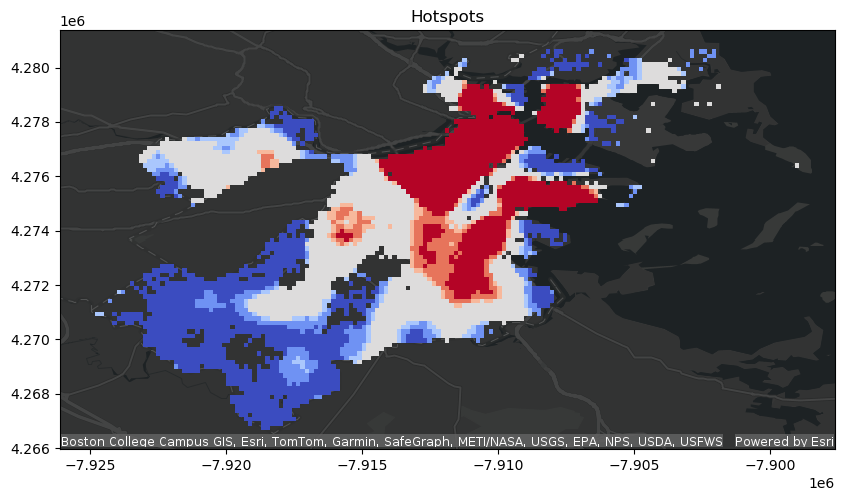

In [33]:
# plot results from the hotspot calculation
result_plot = result_service_calls\
    .st.plot(cmap_values="Gi_Bin",
                             cmap="coolwarm",
                             basemap="dark",
                             figsize=(10,10))
result_plot.set_title("Hotspots");

# Summary
In this sample notebook, we have explored how ArcGIS GeoAnalytics can help you examine trends and hotspots in spatial datasets. 

For more information on the spatial analysis methods presented, you can find more details here: 
* [Spatial joins](https://developers.arcgis.com/geoanalytics-fabric/core-concepts/spatial-joins/)
* [Spatial relationships](https://developers.arcgis.com/geoanalytics-fabric/core-concepts/spatial-relationships/)
* [Aggregate points](https://developers.arcgis.com/geoanalytics-fabric/tools/aggregate-points/)
* [Find Hot Spots](https://developers.arcgis.com/geoanalytics-fabric/tools/find-hot-spots/)

And more information about the general supporting methods for working with spatial data here:
* [Coordinate systems and transformations](https://developers.arcgis.com/geoanalytics-fabric/core-concepts/coordinate-systems/)
* [Time stepping](https://developers.arcgis.com/geoanalytics-fabric/core-concepts/time-stepping/)


There are more than 180 [spatial functions](https://developers.arcgis.com/geoanalytics-fabric/sql-functions/) and [tools](https://developers.arcgis.com/geoanalytics-fabric/tools/) in ArcGIS GeoAnalytics and this is just a small set of the capabilities.  For more details on what is included in the library, check out the [developer documentation](https://developers.arcgis.com/geoanalytics-fabric/)
